In [15]:
import os
import matplotlib.pyplot as plt
import numpy as np
from ultralytics import YOLO 
import tensorflow as tf 
import torch
from yolov5.models.yolo import Model  
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.cluster import KMeans
from PIL import Image
import torch.optim as optim
from torchvision.transforms import v2

# Pretraining

In [3]:
for dirname, _, filenames in os.walk('./data/'):
    for filename in filenames:
        pass

In [4]:
#will before we do anything we will need ultralytics so lets pip install that
!pip install ultralytics

Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [5]:
# Lets now train our model
with tf.device("/GPU"): #this will force the note book to use the GPU
    model = YOLO("yolov5n.yaml")
    results = model.train(data=os.getcwd()+"/data/datayaml.yaml", epochs=50)
    torch.save(model.model.state_dict(), './mymodel.pth')


                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

train: Scanning C:\Users\priya\OneDrive - Johns Hopkins\Deep Learning\FinalProject\data\train\labels.cache... 5805 images, 93 backgrounds, 0 corrupt: 100%|██████████| 5805/5805 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning C:\Users\priya\OneDrive - Johns Hopkins\Deep Learning\FinalProject\data\valid\labels.cache... 549 images, 8 backgrounds, 0 corrupt: 100%|██████████| 549/549 [00:00<?, ?it/s]


Plotting labels to runs\detect\train9\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train9
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.45G      3.456      3.502      3.162        225        640: 100%|██████████| 363/363 [00:56<00:00,  6.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:05<00:00,  3.58it/s]

                   all        549       6270      0.294      0.105     0.0846     0.0376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.17G      2.169      1.997      1.801        191        640: 100%|██████████| 363/363 [00:50<00:00,  7.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.26it/s]

                   all        549       6270      0.452      0.342      0.343      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.73G      1.853      1.574      1.513        210        640: 100%|██████████| 363/363 [00:48<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.30it/s]

                   all        549       6270      0.614      0.405      0.454      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.89G      1.679      1.344      1.386        232        640: 100%|██████████| 363/363 [00:48<00:00,  7.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:04<00:00,  4.37it/s]

                   all        549       6270      0.606      0.492      0.536      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.54G       1.65      1.277      1.347        164        640:  18%|█▊        | 64/363 [00:08<00:41,  7.22it/s]


KeyboardInterrupt: 

In [ ]:
# Load the model configuration
model = Model('./yolov5/models/yolov5n.yaml')

# Load the pre-trained weights
model_path = './mymodel.pth'
pretrained_dict = torch.load(model_path)

# Update model's state dict
model.load_state_dict(pretrained_dict, strict=False)

# Set the model to evaluation mode
model.eval()


                 from  n    params  module                                  arguments                     
  0                -1  1      1760  yolov5.models.common.Conv               [3, 16, 6, 2, 2]              
  1                -1  1      4672  yolov5.models.common.Conv               [16, 32, 3, 2]                
  2                -1  1      4800  yolov5.models.common.C3                 [32, 32, 1]                   
  3                -1  1     18560  yolov5.models.common.Conv               [32, 64, 3, 2]                
  4                -1  2     29184  yolov5.models.common.C3                 [64, 64, 2]                   
  5                -1  1     73984  yolov5.models.common.Conv               [64, 128, 3, 2]               
  6                -1  3    156928  yolov5.models.common.C3                 [128, 128, 3]                 
  7                -1  1    295424  yolov5.models.common.Conv               [128, 256, 3, 2]              
  8                -1  1    296448  

DetectionModel(
  (model): Sequential(
    (0): Conv(
      (conv): Conv2d(3, 16, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2), bias=False)
      (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (1): Conv(
      (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
      (act): SiLU(inplace=True)
    )
    (2): C3(
      (cv1): Conv(
        (conv): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (cv2): Conv(
        (conv): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
     

# UNET

In [2]:
import cv2
class ContrastEnhancement():
    def __init__(self, clip_limit = 2.0, tile_grid_size = (8,8)):
        self.clip_limit = clip_limit
        self.tile_grid_size = tile_grid_size

    def __call__(self, img):
        img = np.array(img)
        lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=self.clip_limit,tileGridSize=self.tile_grid_size)
        cl = clahe.apply(l)
        limg = cv2.merge((cl,a,b))
        enhanced = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
        return enhanced

custom_contrast = ContrastEnhancement()

In [36]:
class ImageDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.folder_path = folder_path
        self.transform = transform
        self.image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, index):
        img_name = self.image_files[index]
        img_path = os.path.join(self.folder_path, img_name)
        image = Image.open(img_path).convert("RGB")
        if self.transform is not None:
            image = self.transform(image)
        return image, img_name


# Define transformations, you can modify these as per your need
transform = v2.Compose([
    v2.Resize((400, 400)), 
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.RandomCrop((256,256)),
    v2.Lambda(custom_contrast),
    v2.ToTensor(),
    v2.Normalize(mean=[0.4530, 0.4524, 0.4495], std=[0.1891, 0.1909, 0.1975])
])

val_transform = v2.Compose([
    v2.Resize((256, 256)),
    v2.ToTensor()
])

# Create the dataset
dataset = ImageDataset(folder_path='./data/train/images/', transform=val_transform)
valid_dataset = ImageDataset(folder_path='./data/valid/images', transform=val_transform)
test_dataset = ImageDataset(folder_path = './data/test/images/', transform = val_transform)
# Create the DataLoader
data_loader = DataLoader(dataset, batch_size=10, shuffle=True)
valid_loader =DataLoader(valid_dataset, batch_size=1, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=1)
print("Number of batches in the train data loader:", len(data_loader))
print("Number of batches in the valid data loader:", len(valid_loader))
print("Number of batches in the test data loader:", len(test_dataloader))


Number of batches in the train data loader: 581
Number of batches in the valid data loader: 549
Number of batches in the test data loader: 279


In [4]:
class OutConv(torch.nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = torch.nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)
    
class DoubleConv(torch.nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        mid_channels = out_channels // 2  # Adjust the mid_channels based on out_channels
        self.double_conv = torch.nn.Sequential(
            torch.nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(mid_channels),
            torch.nn.ReLU(inplace=True),
            torch.nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)
    
class Up(torch.nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels):
        super(Up, self).__init__()
        self.up = torch.nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        # in_channels include channels from upsampled feature and skip connection
        self.double_conv = DoubleConv(in_channels + skip_channels, out_channels)

    def forward(self, x, skip=None):
        x = self.up(x)
        if skip is not None:
            # Ensure that the dimensions match
            x = torch.nn.functional.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=True)
            x = torch.cat([x, skip], dim=1)  # Concatenate along channel dimension
            # print(f"Shape after concatenation in Up layer: {x.shape}")
        x = self.double_conv(x)
        return x

In [5]:
class YoloEncoder(torch.nn.Module):
    def __init__(self, yolov5_model):
        super(YoloEncoder, self).__init__()
        self.yolov5_model = yolov5_model

    def forward(self, x):
        features = []
        for i, layer in enumerate(self.yolov5_model.model.children()):

            skip_connections = []
            if (i == 12):
                skip_connections.append(features[-1]) # layer 11
                skip_connections.append(features[6]) # layer 6
                x = layer(skip_connections)
            elif(i == 16):
                skip_connections.append(features[-1]) # layer 15
                skip_connections.append(features[4]) # layer 4
                x = layer(skip_connections)
            elif(i == 19):
                skip_connections.append(features[-1]) # layer 18
                skip_connections.append(features[14]) # layer 14
                x = layer(skip_connections)
            elif(i == 22):
                skip_connections.append(features[-1]) # layer 21
                skip_connections.append(features[10]) # layer 10
                x = layer(skip_connections)
            else:
                x = layer(x)

            # Append features or handle them 
            features.append(x)
            if i == 23:
                break

        return features

In [40]:
class UNetWithYoloEncoder(torch.nn.Module):
    def __init__(self, yolov5_encoder, n_classes):
        super(UNetWithYoloEncoder, self).__init__()
        self.encoder = yolov5_encoder
        # Adjust the Up layer initializations
        self.up1 = Up(512, 0, 256) # input = layer 23 output
        self.up2 = Up(256*2, 0, 128) # layer 20
        self.up3 = Up(128*2, 0, 256) # layer 17
        self.up4 = Up(256*2, 0, 512) # layer 13
        self.up5 = Up(512*2, 0, 256) # layer 9
        self.up6 = Up(256*2, 0, 128) # layer 6
        self.up7 = Up(128*2, 0, 64) # layer 4
        self.up8 = Up(64*2, 0, 16) # layer 2
        self.out_conv = torch.nn.Conv2d(16, n_classes, kernel_size=1)  # Update input channels
        self.finalActivation = torch.nn.Sigmoid()

    def forward(self, x):
        features = self.encoder(x)
        # Follow layers given above
        x = self.up1(features[23])
        x = self.up2(x, features[20])
        x = self.up3(x, features[17])
        x = self.up4(x, features[13])
        x = self.up5(x, features[9])
        x = self.up6(x, features[6])
        x = self.up7(x, features[4])
        x = self.up8(x, features[2])
        
        x = self.out_conv(x)
        x = torch.nn.functional.interpolate(x, size=(256, 256), mode='bilinear', align_corners=True)
        x = self.finalActivation(x)
        return x

In [26]:
class KMeansClusteringLoss(torch.nn.Module):
    def __init__(self, num_clusters):
        super(KMeansClusteringLoss, self).__init__()
        self.num_clusters = num_clusters
        self.kmeans = KMeans(n_clusters=num_clusters, n_init=10)

    def compute_loss(self, features):
        # Apply k-means to the features
        self.kmeans.fit(features.cpu().detach().numpy())
        cluster_centers = torch.tensor(self.kmeans.cluster_centers_, device=features.device)

        # Calculate the distance of each feature from its cluster center
        distances = torch.norm(features.unsqueeze(1) - cluster_centers, dim=2)

        # Assign each feature to the closest cluster center
        min_distances = distances.min(dim=1)[0]

        # Loss is the mean of these minimum distances
        return torch.mean(min_distances)

    def forward(self, features):
        # Compute the clustering loss
        return self.compute_loss(features)



In [8]:
def imshow_normalized(inp, is_mask=False):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    if not is_mask:
        inp = np.clip(inp, 0, 1)
    else:
        inp = inp.argmax(axis=2)  # Convert channel-wise predictions to class indices
    
    plt.imshow(inp, cmap='viridis' if is_mask else None)  # Use a colormap for masks


In [57]:
%matplotlib inline

# Set the device (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the YOLOv5 model and convert its parameters to float32
yolov5_model = torch.load('./yolov5s.pt', map_location=device)['model']
yolov5_model = yolov5_model.to(torch.float32)  # Convert to float32
# print(yolov5_model)

# Create the YOLO encoder
yolo_encoder = YoloEncoder(yolov5_model).to(device)

# Instantiate your custom model
model = UNetWithYoloEncoder(yolo_encoder, n_classes=5)  # Adjust the number of classes accordingly
model.to(device)

# Load the state dictionary into your custom model
state_dict = torch.load('./mymodel.pth', map_location=device)
model.load_state_dict(state_dict, strict=False)

loss_fn = torch.nn.CrossEntropyLoss()
kmeans = KMeans(n_clusters=5, n_init=10)

optimizer = optim.Adam(model.parameters(), lr=0.1)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

num_epochs = 25  # Set the number of epochs

for epoch in range(num_epochs):
    model.train()  # Set the model to training mode
    running_loss = 0.0
    clustering_loss_sum = 0.0

    for i, (inputs, names) in enumerate(data_loader):  # No need to unpack targets
        inputs = inputs.to(device)  # Send inputs to GPU if available

        optimizer.zero_grad()
        outputs = model(inputs)

        # Convert one-hot encoded or class-dimensioned inputs to class indices
        inputs_indices = torch.argmax(inputs, dim=1)

        # Compute primary loss (e.g., CrossEntropyLoss)
        primary_loss = loss_fn(outputs, inputs_indices)  # Replace with your actual loss calculation

        # Compute clustering loss
        batch_size, channels, height, width = outputs.shape
        pixel_features = outputs.view(batch_size * height * width, channels)

        # Move pixel features to CPU for K-means
        pixel_features_cpu = pixel_features.cpu().detach().numpy()

        # Apply K-means clustering
        kmeans.fit(pixel_features_cpu)
        
        primary_loss = loss_fn(outputs, torch.Tensor(kmeans.predict(pixel_features_cpu)))
        primary_loss.backward()
        optimizer.step()

        # Update running loss for printing
        running_loss += primary_loss.item()

        # Visualization and printing code...
        if i % 700 == 0:

            image_name = names[0]
            # Convert the batch to CPU and detach it
            inputs_cpu = inputs.cpu().detach()
            outputs_cpu = outputs.cpu().detach()

            # Display the first image in the batch
            plt.figure(figsize=(10, 5))
            plt.subplot(1, 2, 1)
            imshow_normalized(inputs_cpu[0])
            plt.title("Original Image")
            print(image_name)


            plt.subplot(1, 2, 2)
            imshow_normalized(outputs_cpu[0], is_mask=True)
            plt.title("Output Mask")

            plt.show()
            plt.close()

    epoch_loss = running_loss / len(data_loader)
    # epoch_clustering_loss = clustering_loss_sum / len(data_loader)
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}')

    # Start validation
    model.eval()  # Set the model to evaluation mode
    val_loss = 0.0
    with torch.no_grad():  # No gradient computation in validation phase
        for i, (val_inputs, names) in enumerate(valid_loader):
            val_inputs = val_inputs.to(device)
            val_outputs = model(val_inputs)
            
            val_inputs_indices = torch.argmax(val_inputs, dim=1)
            loss = loss_fn(val_outputs, val_inputs_indices)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(valid_loader)
    print(f'Epoch {epoch+1}/{num_epochs}, Validation Loss: {avg_val_loss:.4f}')
    scheduler.step()


ValueError: Expected input batch_size (10) to match target batch_size (655360).

In [ ]:
def imshow_tensor(inp, is_mask=False):
    """Imshow for Tensor without normalization."""
    inp = inp.numpy().transpose((1, 2, 0))
    if is_mask:
        inp = inp.argmax(axis=2)  # Convert channel-wise predictions to class indices
    
    plt.imshow(inp, cmap='viridis' if is_mask else None)  # Use a colormap for masks

aguanambi-1000_png_jpg.rf.7179a0df58ad6448028bc5bc21dca41e.jpg


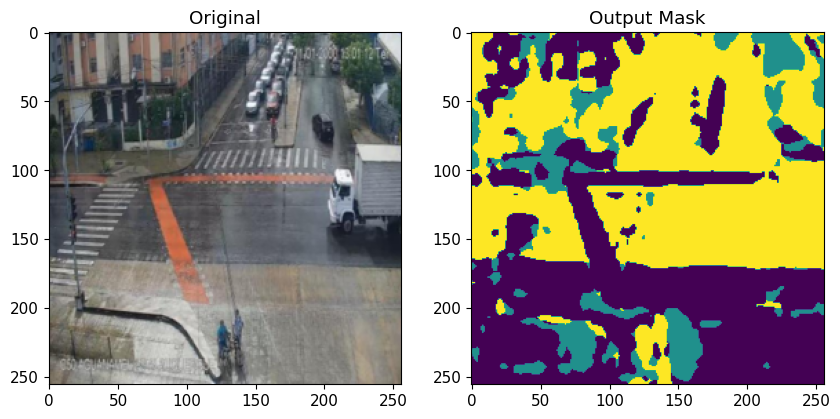

aguanambi-1680_png_jpg.rf.fede1a51e422cc8fd628a4846615f65f.jpg


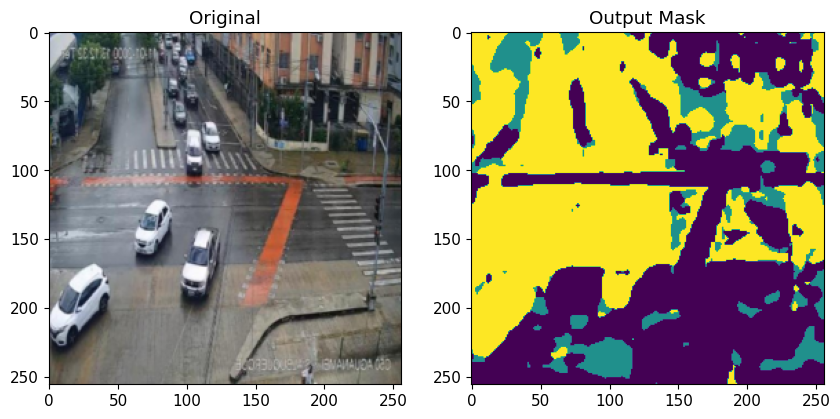

aguanambi-2555_png_jpg.rf.e8fe552acc205329ac459d1087eb0637.jpg


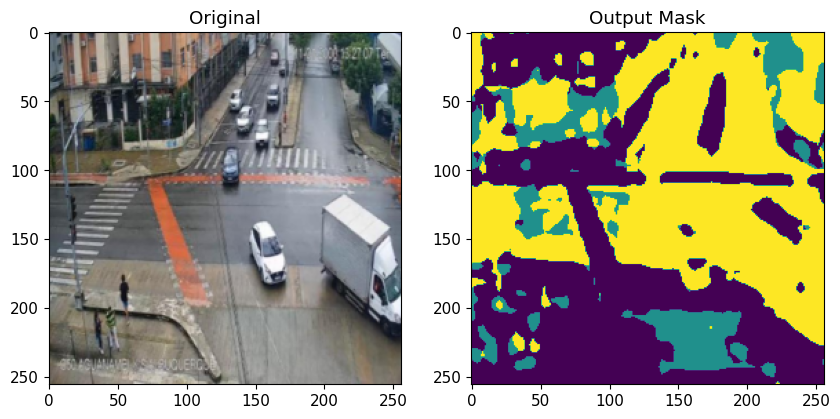

aguanambi-3125_png_jpg.rf.c928762f63b976739588cd27f57fcede.jpg


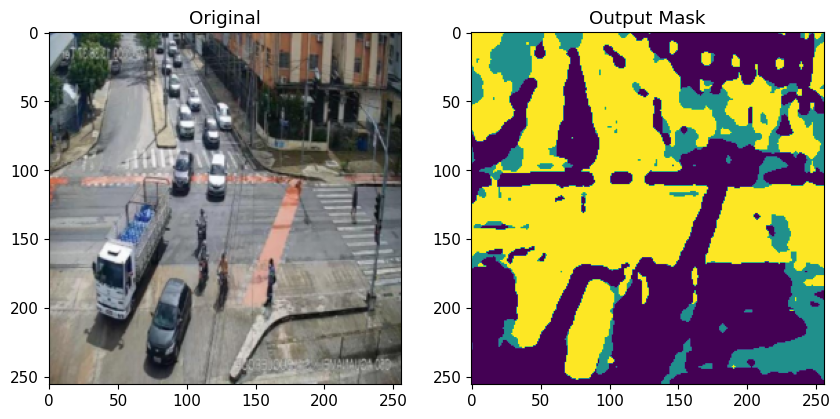

aguanambi-3565_png_jpg.rf.a8e3ff61869acbaab7d4554782ef6c0b.jpg


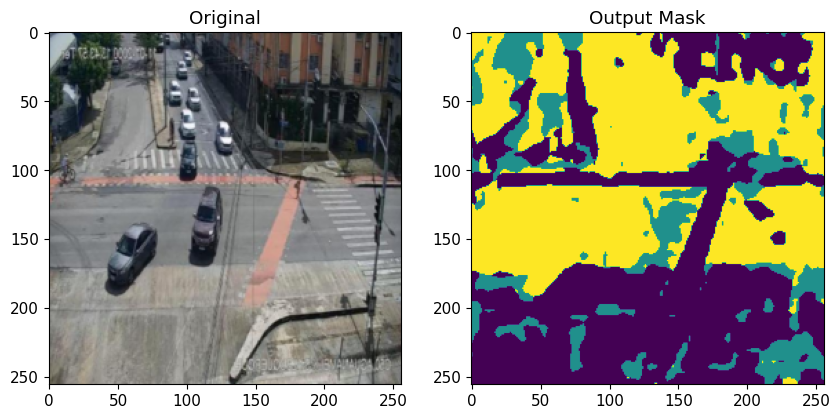

aguanambi-4130_png_jpg.rf.4a11f5840001e2dafed224d41a79b33c.jpg


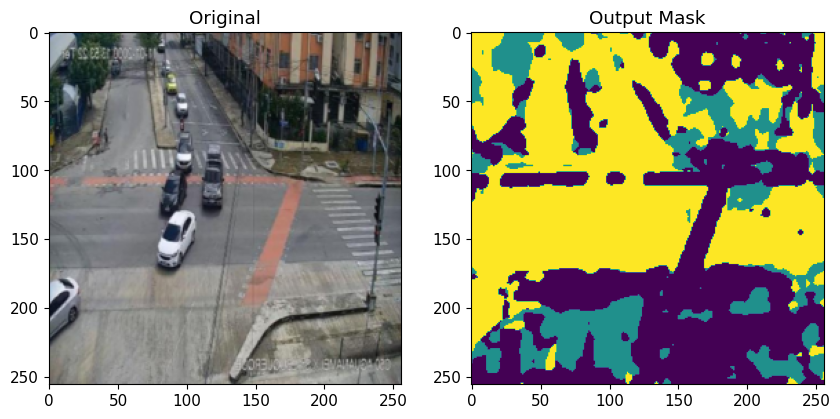

aguanambi-4540_png_jpg.rf.0a1d526d5508f4c7fe815c356babea4d.jpg


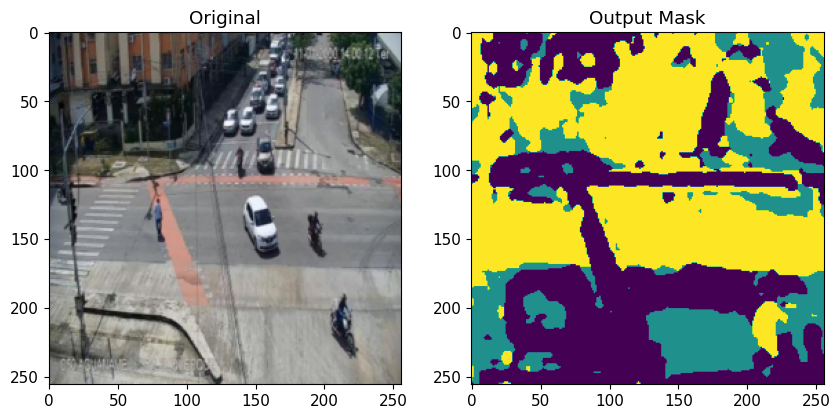

aguanambi-4980_png_jpg.rf.12a1415ecb01eb7dc9e3045f0ff5a669.jpg


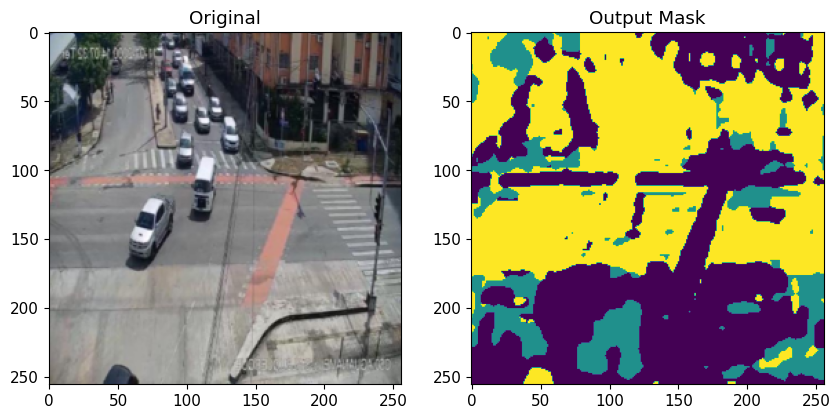

aguanambi-5425_png_jpg.rf.14d5886ee52334426d7f89d58c2de516.jpg


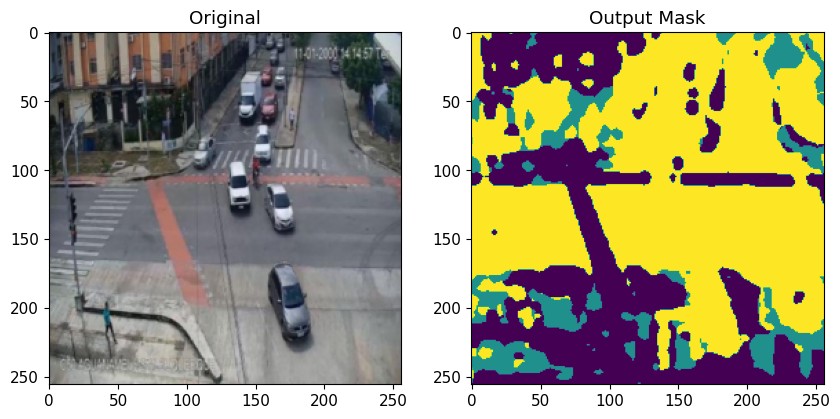

ant_sales-10110_png_jpg.rf.a5602c76417d103234fc3a3af6a005c8.jpg


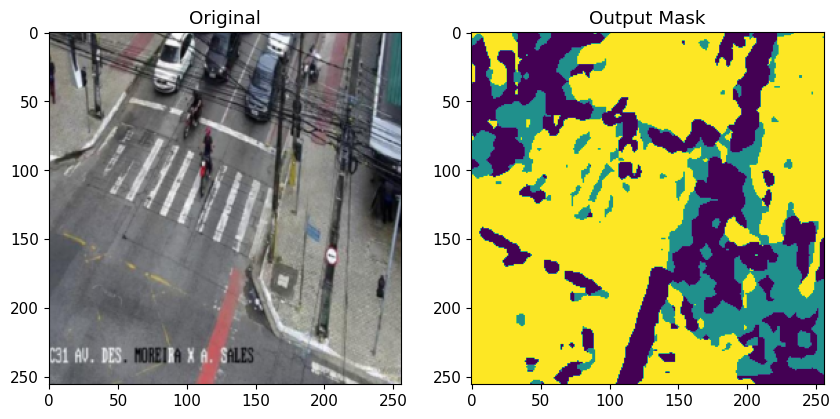

ant_sales-10395_png_jpg.rf.4dc62bdef45bf6d71c7fe52a00e189da.jpg


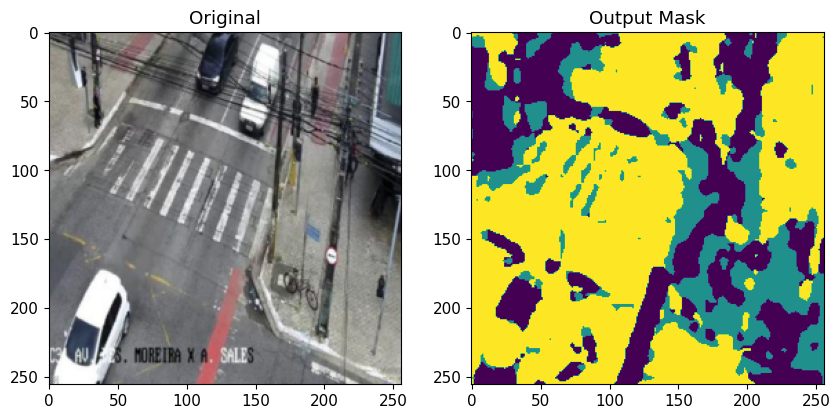

ant_sales-10495_png_jpg.rf.126cf8442bcbe8880c7c10958c36f8da.jpg


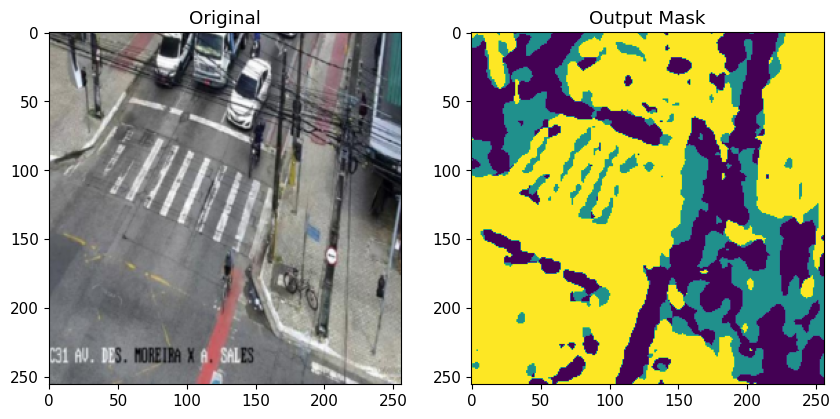

ant_sales-10710_png_jpg.rf.acb2b8b2da38205c313e954d051285ae.jpg


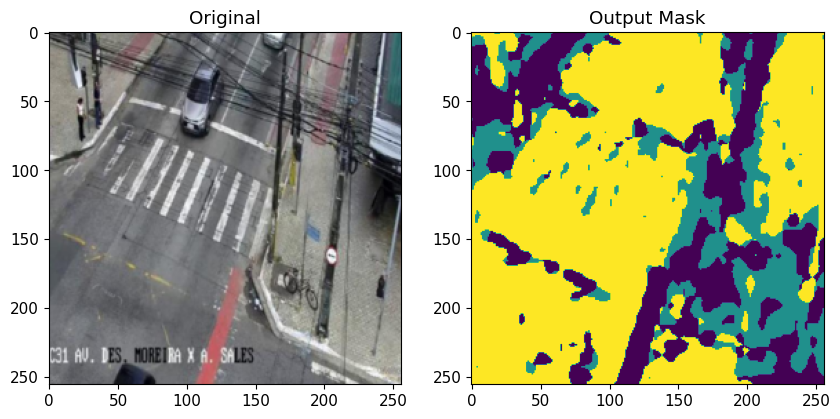

ant_sales-11030_png_jpg.rf.5abd8287f8cc969e0644f73cf40142d5.jpg


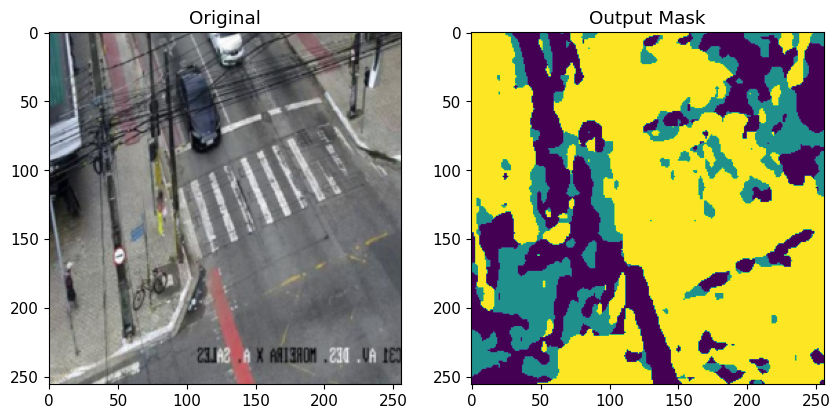

ant_sales-11185_png_jpg.rf.b6d79b3c7bdcf7221dbb59bc7c92f2b8.jpg


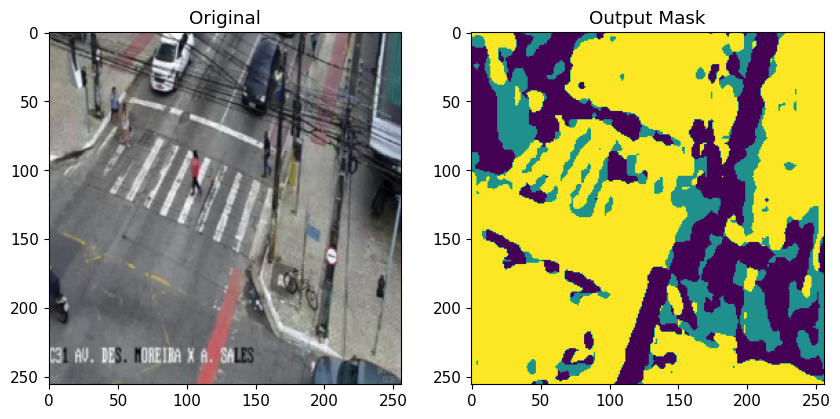

ant_sales-11460_png_jpg.rf.e3569c9ca4f55ad39bdb9f18ae48240f.jpg


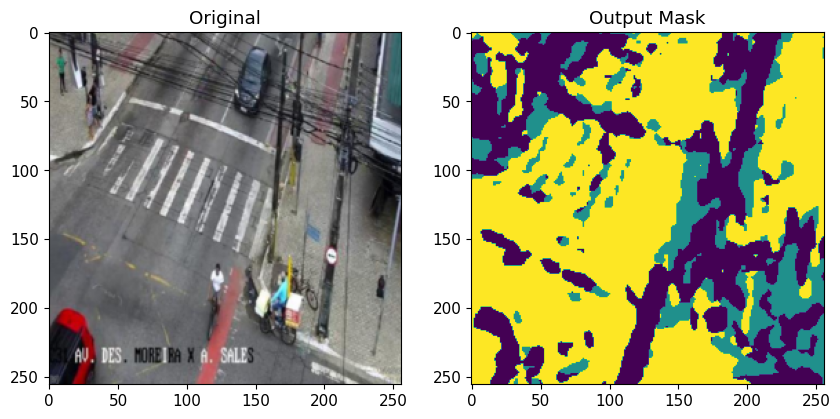

ant_sales-11740_png_jpg.rf.4d7c76301215a7b5e8946757a22f6696.jpg


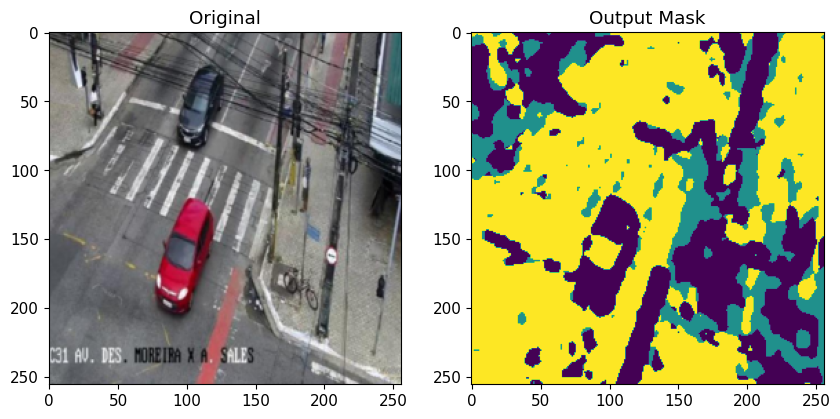

ant_sales-11985_png_jpg.rf.770e7ae0c76d7e946a3b00e086f74a00.jpg


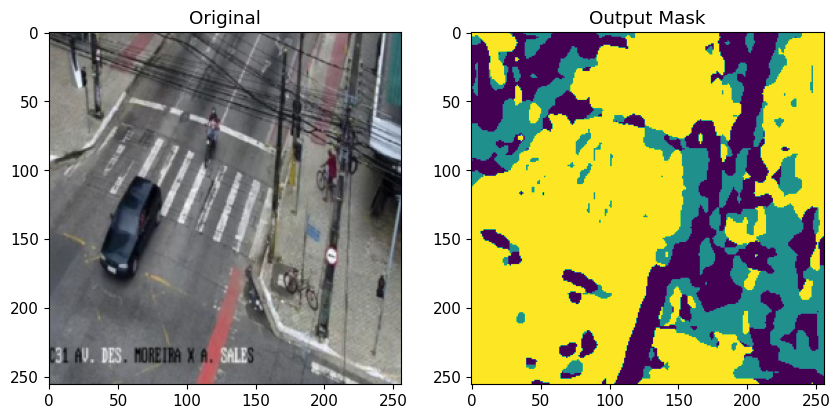

ant_sales-12160_png_jpg.rf.76670361f96a8c1e973633b8df726a5f.jpg


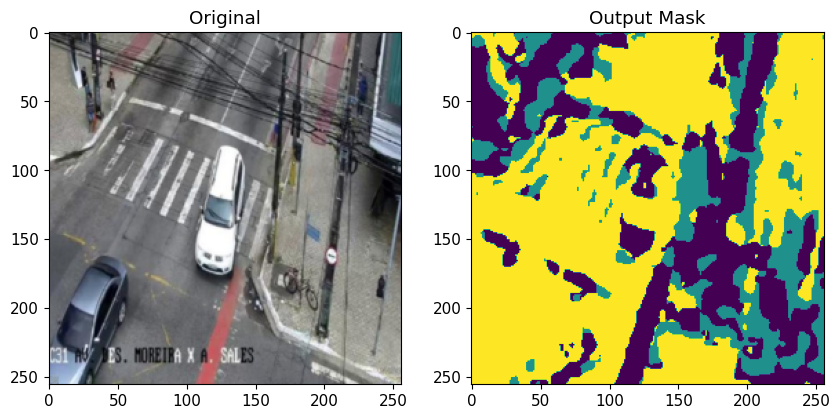

ant_sales-1815_png_jpg.rf.7743f5a03372d4c0928f0c6f23b0546b.jpg


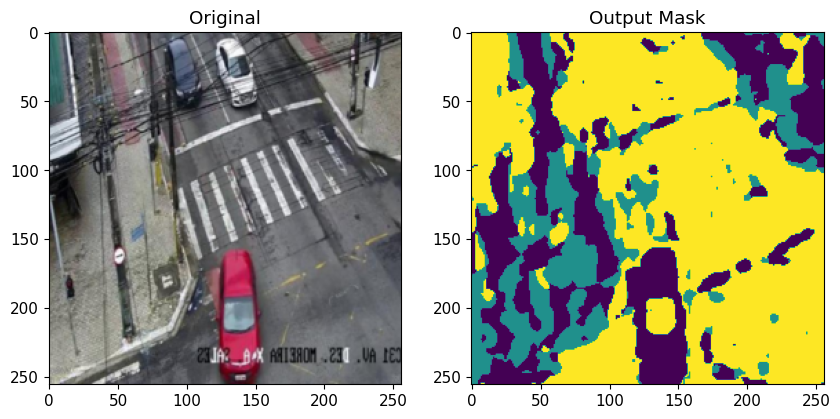

ant_sales-2185_png_jpg.rf.ef9570c136e91a3119c09d600c86a4a3.jpg


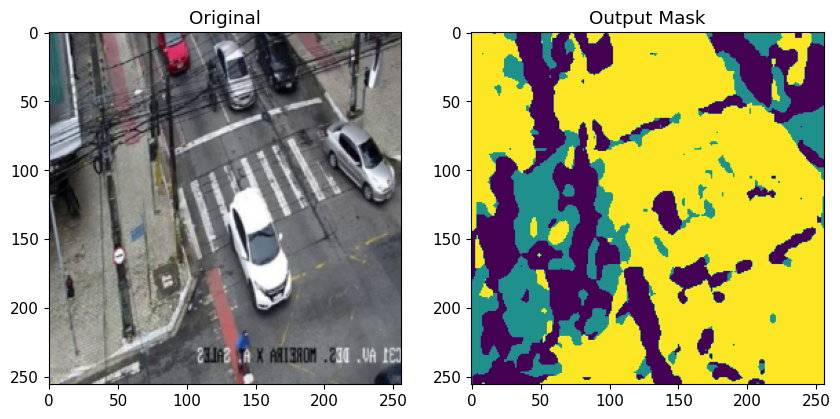

ant_sales-2565_png_jpg.rf.c91afd144300c0fd4405f64a82dd80d6.jpg


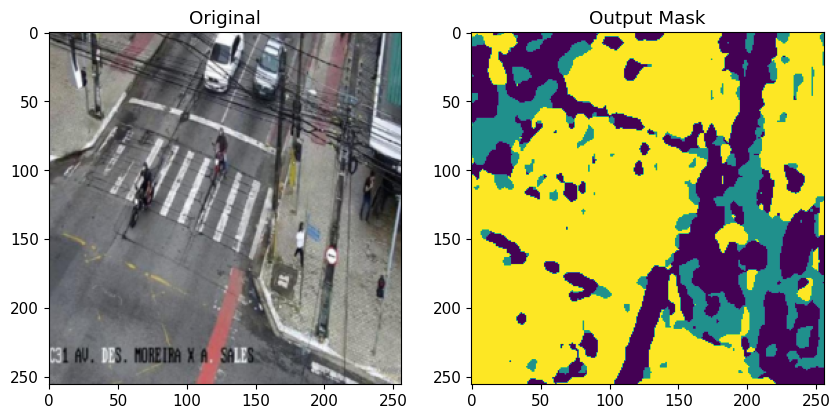

duque_de_caxias-1140_png_jpg.rf.548bee19233d1dc5b1d099ce20ac6487.jpg


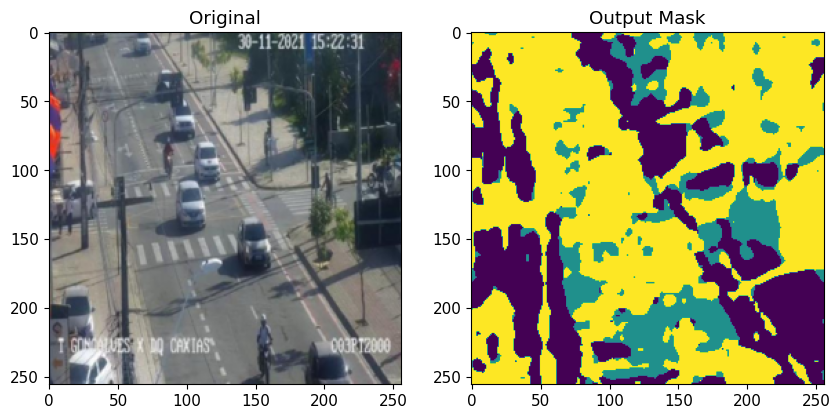

duque_de_caxias-1320_png_jpg.rf.737f18e9181c0c7b771a5a7e3eeea929.jpg


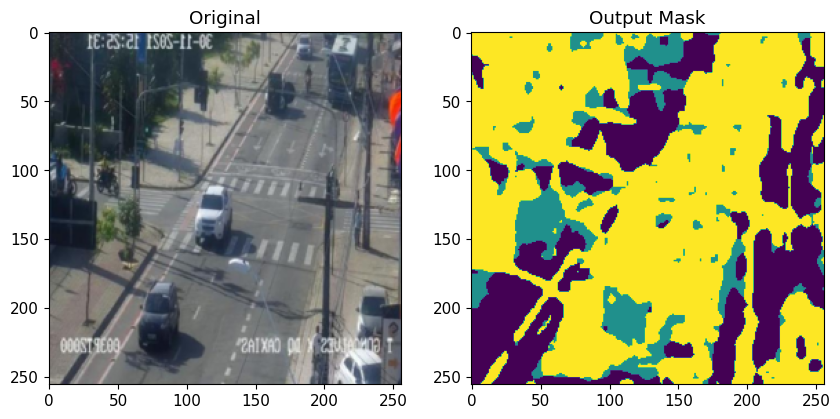

duque_de_caxias-1480_png_jpg.rf.c7749490281879e2c8b39fd6d2f0101e.jpg


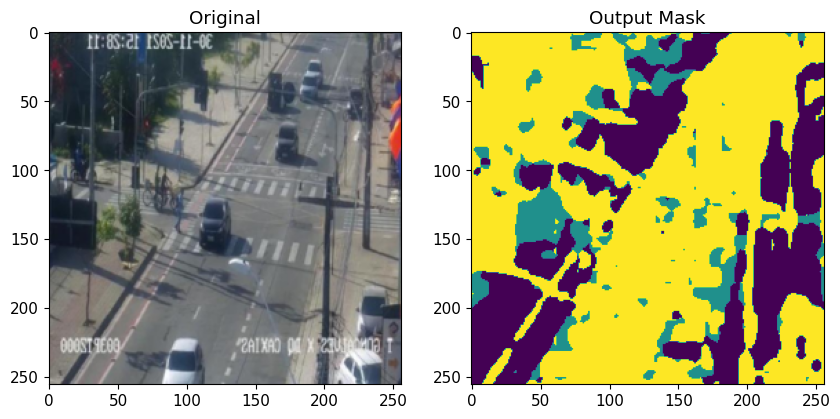

duque_de_caxias-1610_png_jpg.rf.6a2d1ed46436d18cfd9cfc59dd11b02a.jpg


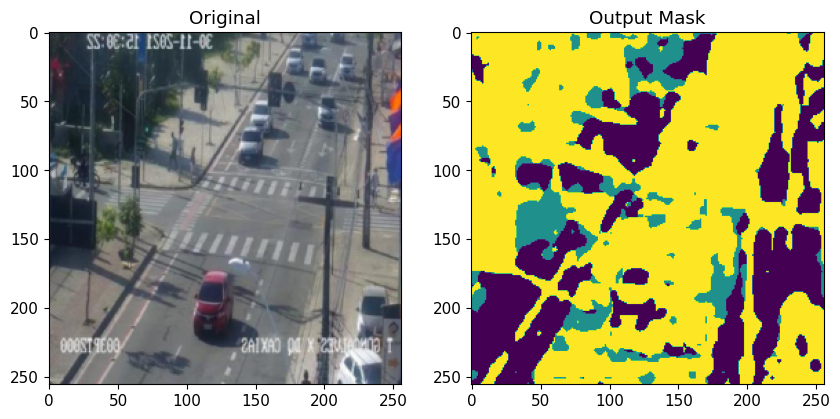

duque_de_caxias-1910_png_jpg.rf.13b8cbe1338d78ba5b13767a834c441c.jpg


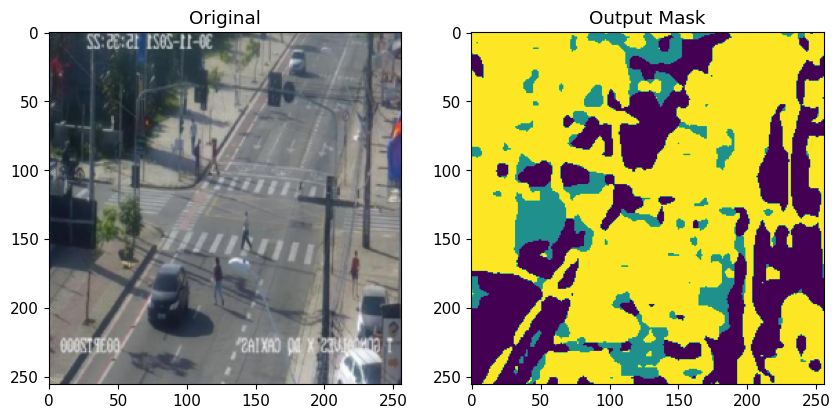

duque_de_caxias-2300_png_jpg.rf.f4138ffc186611f0075c32d24129f7de.jpg


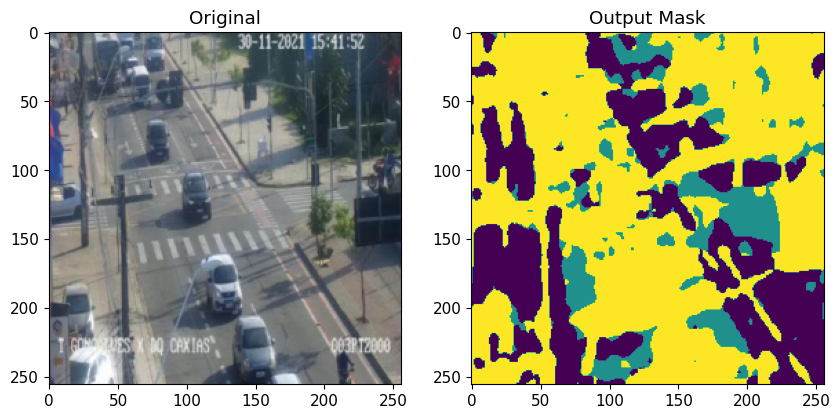

duque_de_caxias-2610_png_jpg.rf.bd729eb3e7cd3cc6c069a9e66e838504.jpg


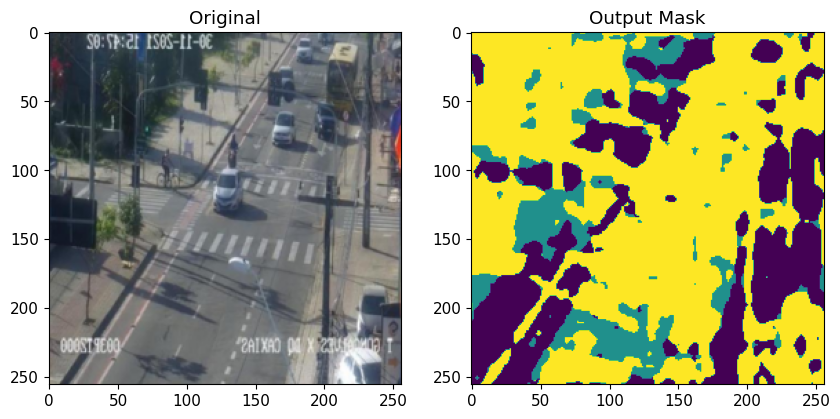

duque_de_caxias-45_png_jpg.rf.997aa3902d2810cec0ed0da3b6fdb4e0.jpg


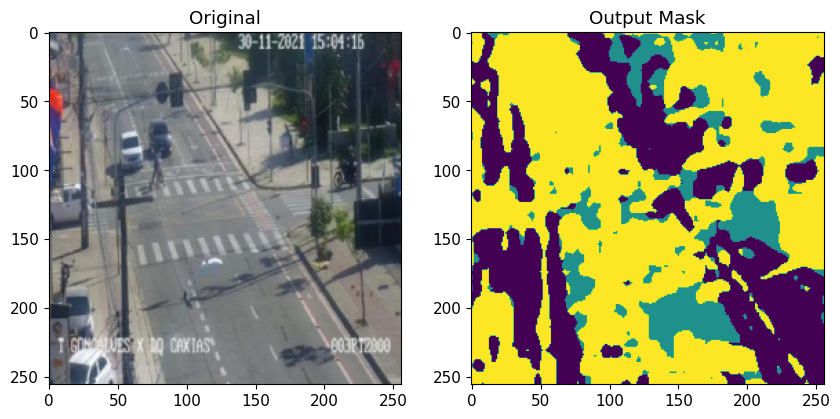

duque_de_caxias-760_png_jpg.rf.87a86a72f6e8c3d07f4aea59e5ccfe30.jpg


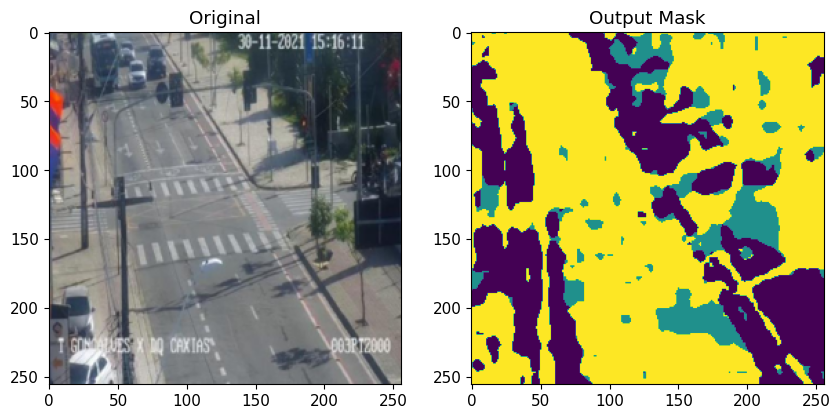

image08_png_jpg.rf.3fa58230a35fb3e0d9abb94959090942.jpg


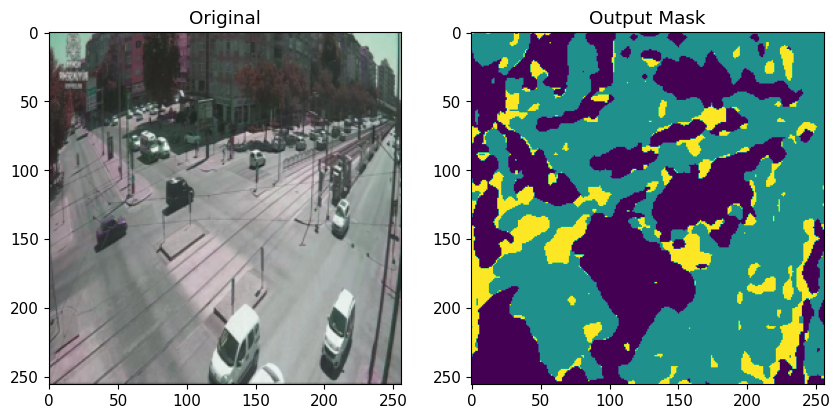

image30_png_jpg.rf.c459ecd0d8922c9379bfc699052182d8.jpg


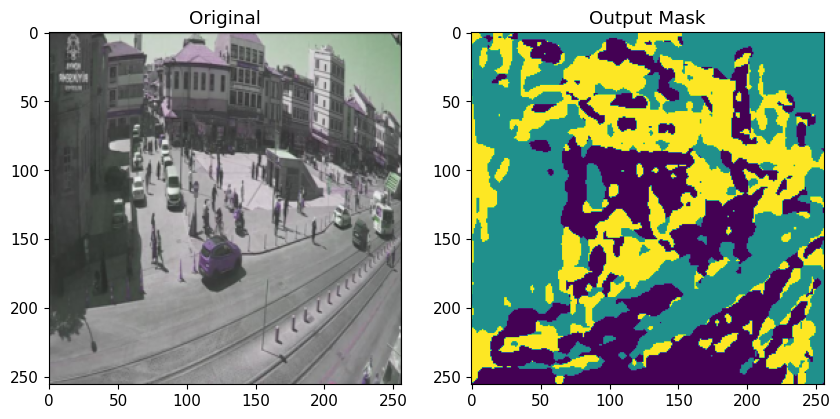

image47_png_jpg.rf.75720d667f1a1ad75ff23f31a5e6436b.jpg


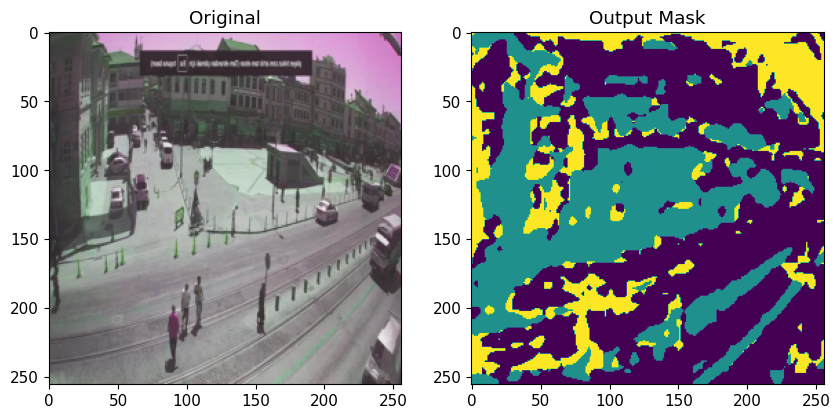

image59_png_jpg.rf.b289a860a3c4cd29addc6a76ac5287b3.jpg


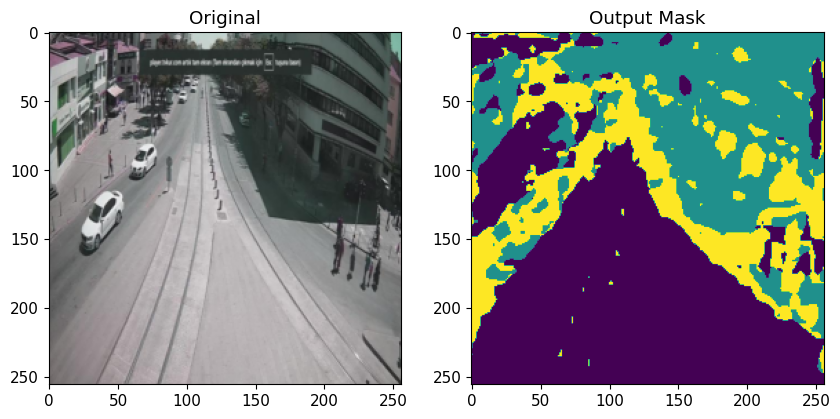

image65_png_jpg.rf.4b59ec23626f2dc537b33c0e021070f3.jpg


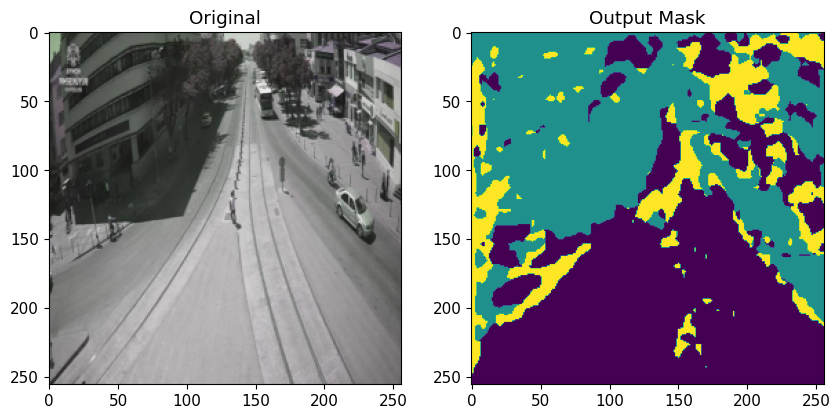

image73_png_jpg.rf.542459ff113f00fcc89c0e0b150b411e.jpg


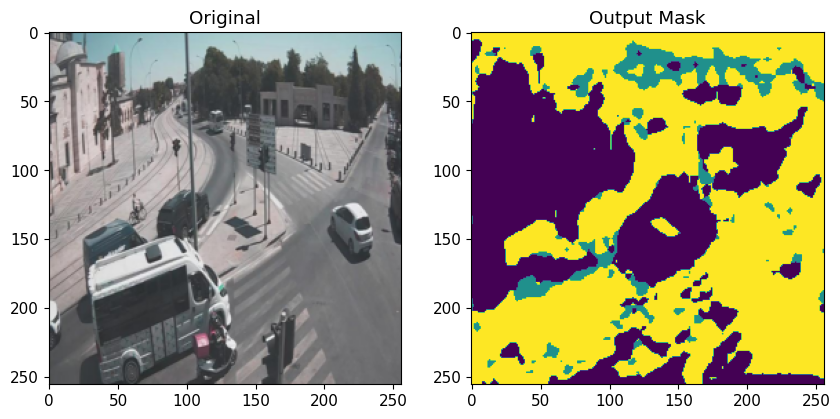

image79_png_jpg.rf.0a0da7876cf851c2478f518fcaba76cb.jpg


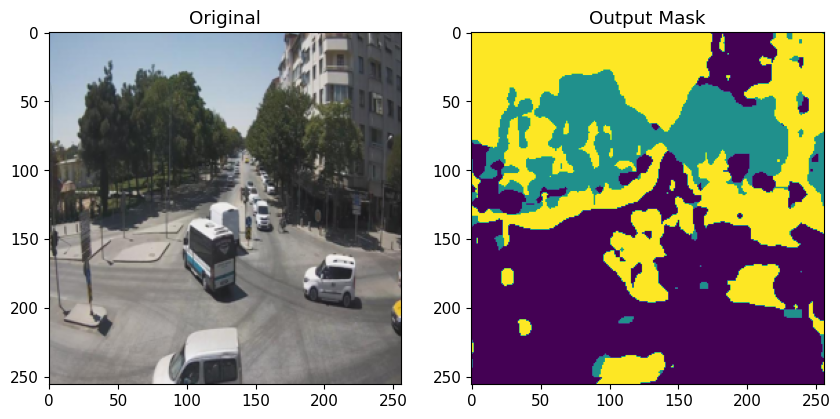

image85_png_jpg.rf.f550e45639ed70b446ed3463f2add9bc.jpg


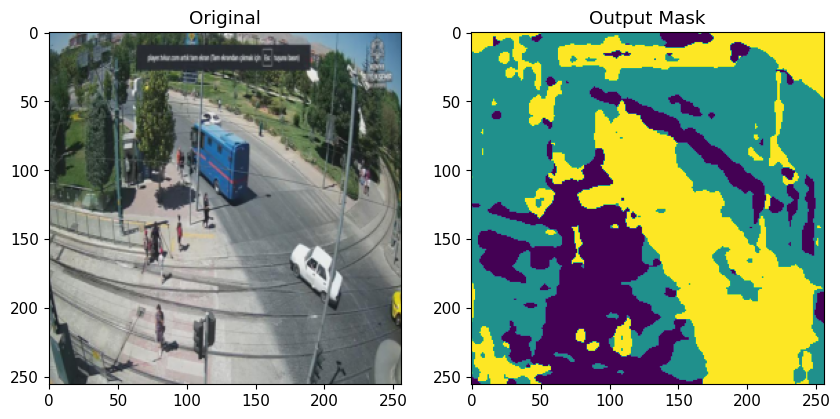

image93_png_jpg.rf.db0e6e038d0f47fd708e5aca86dc3457.jpg


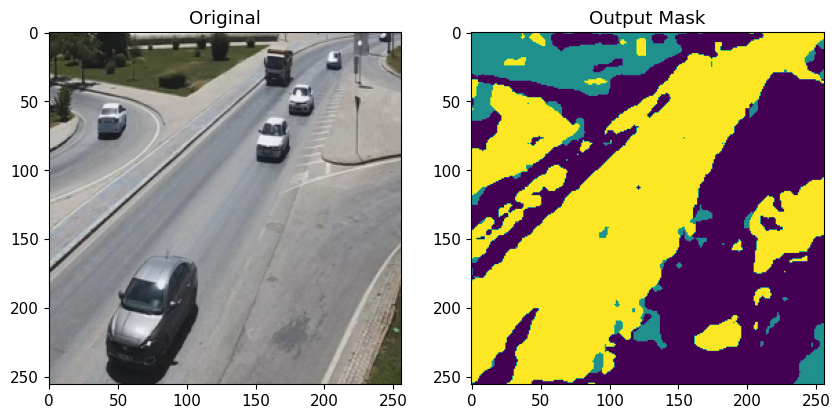

screenshot_11030_jpg.rf.74c2874cac4916f2e472aeb6437bd2ec.jpg


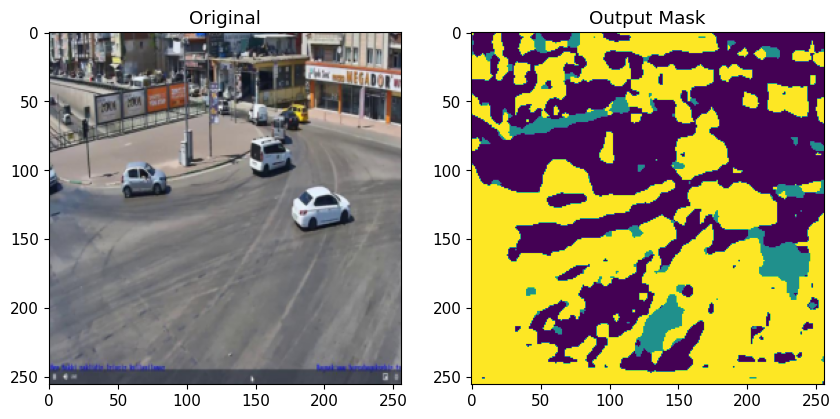

screenshot_11925_jpg.rf.f809b665f8b4efe6469423a4629592eb.jpg


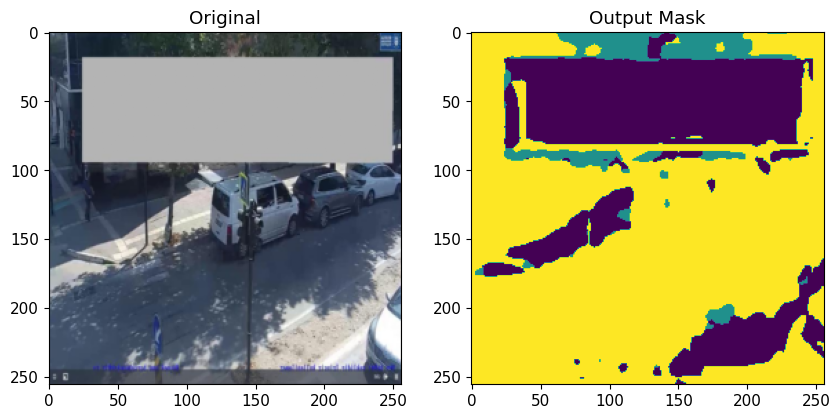

screenshot_12673_jpg.rf.e8f3e418b0bc9c359b0c9064bb2e8383.jpg


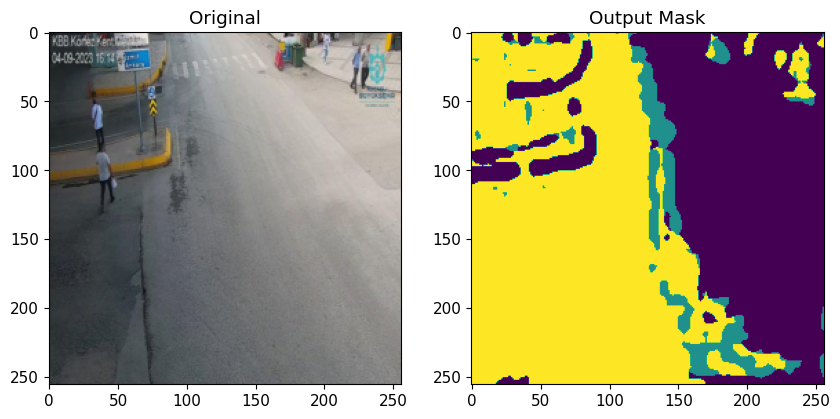

screenshot_149_jpg.rf.bde136cf5d0bc398d6dd9569a5826b34.jpg


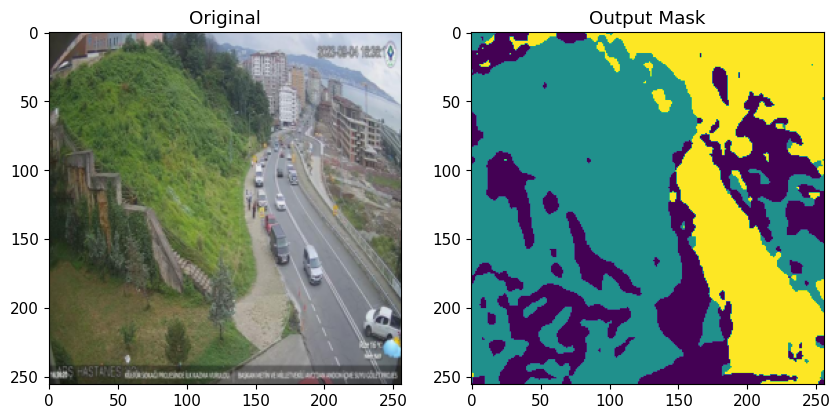

screenshot_1639_jpg.rf.c81c55b50182804ce1aae0d254881e42.jpg


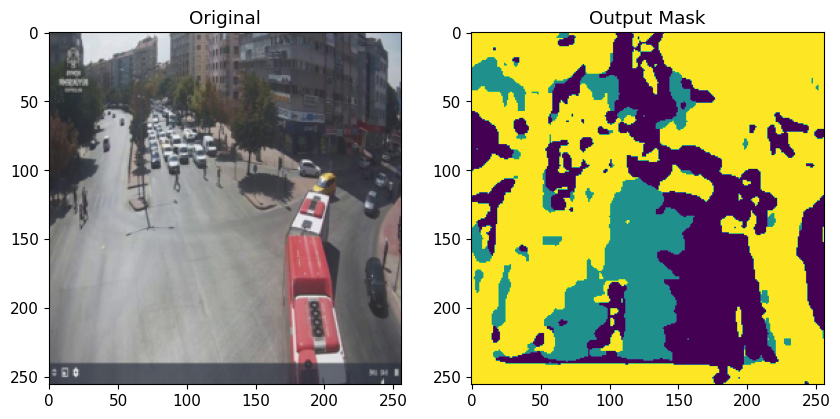

screenshot_1790_jpg.rf.c5aa52e7f13464df9f29993d6bc54d1d.jpg


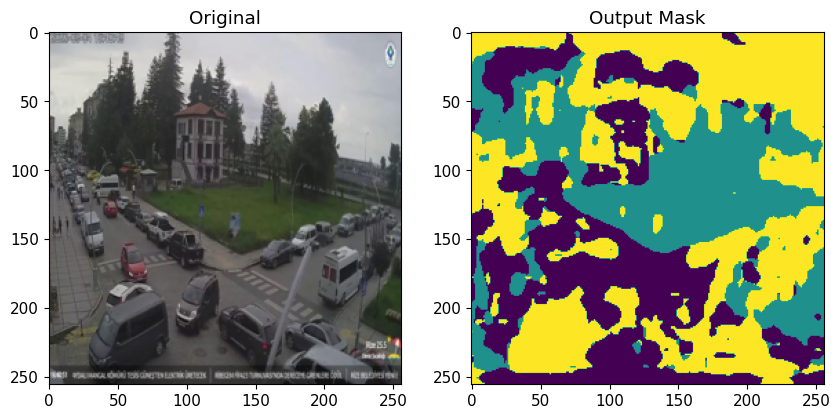

screenshot_25341_jpg.rf.b6353b362a87027fb12315ae60a67221.jpg


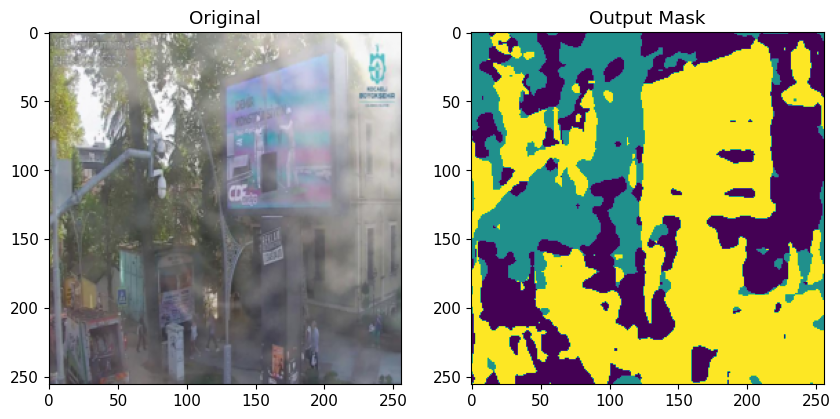

screenshot_27129_jpg.rf.c67a199f07c98e2e2183870698472a3b.jpg


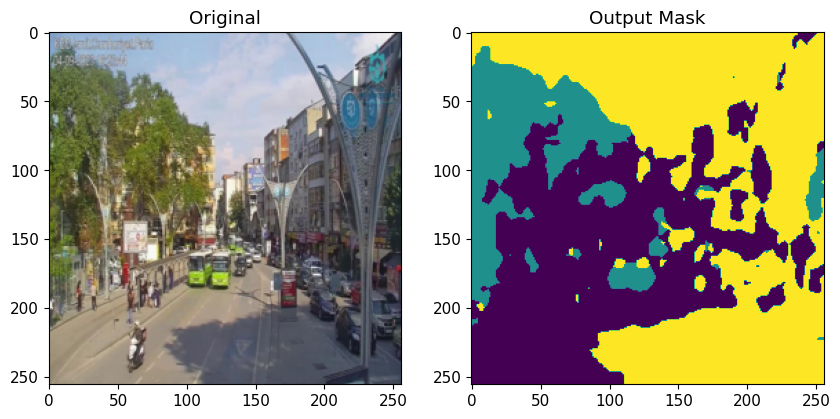

screenshot_29811_jpg.rf.437232d7f824cf21338405e5a5b4284b.jpg


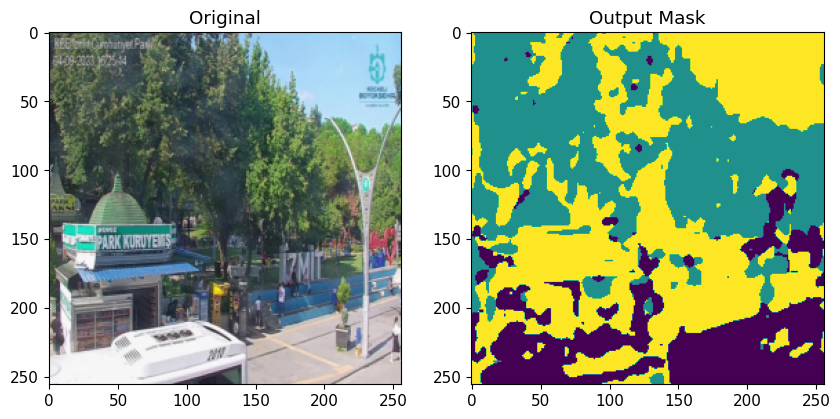

screenshot_3429_jpg.rf.1f0fddd36ee7c6caecb42bd25b9b9087.jpg


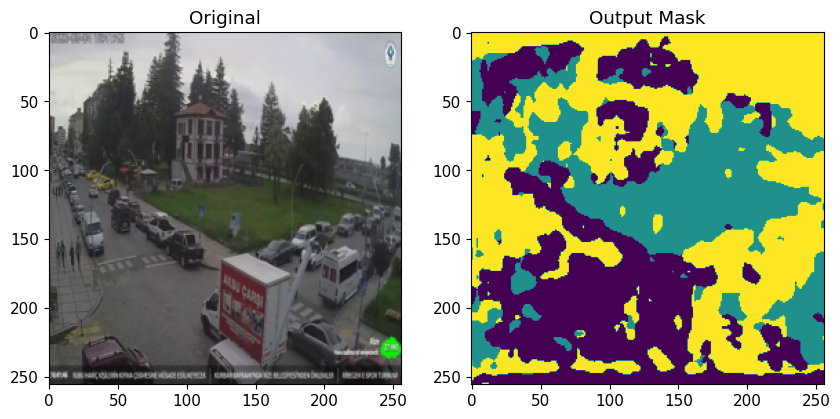

screenshot_36518_jpg.rf.0518486725746279ff2eb223ac6fbb5c.jpg


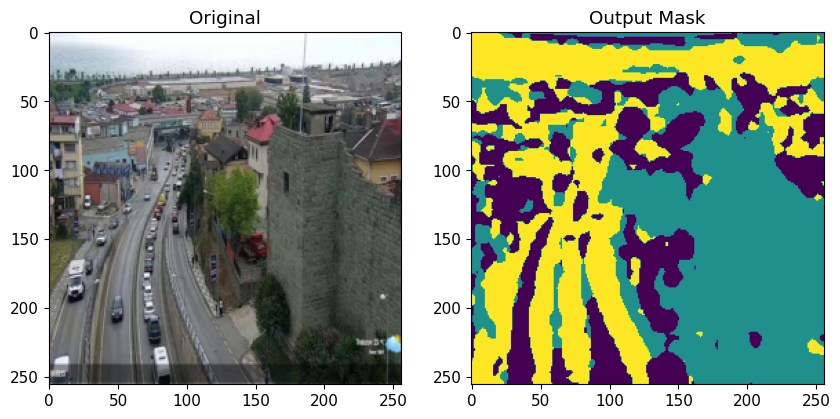

screenshot_447_jpg.rf.104e53fba749790e15549ee781b2fe03.jpg


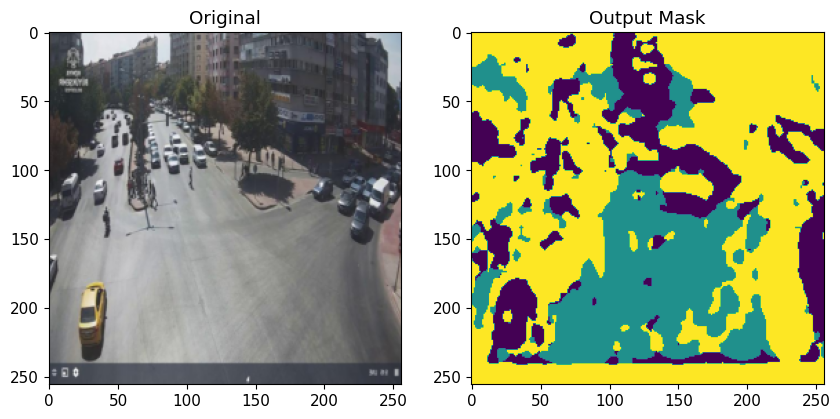

screenshot_5366_jpg.rf.437880e69614f734fe9dd4a0c2c55d58.jpg


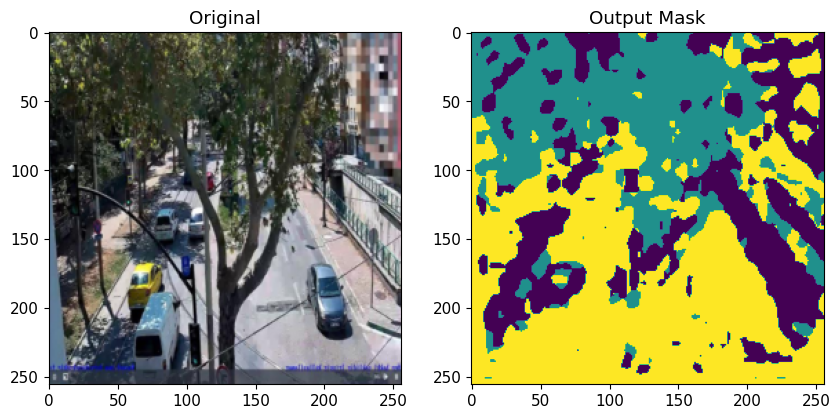

screenshot_7155_jpg.rf.35a027ef26421ff747863a5d883c3083.jpg


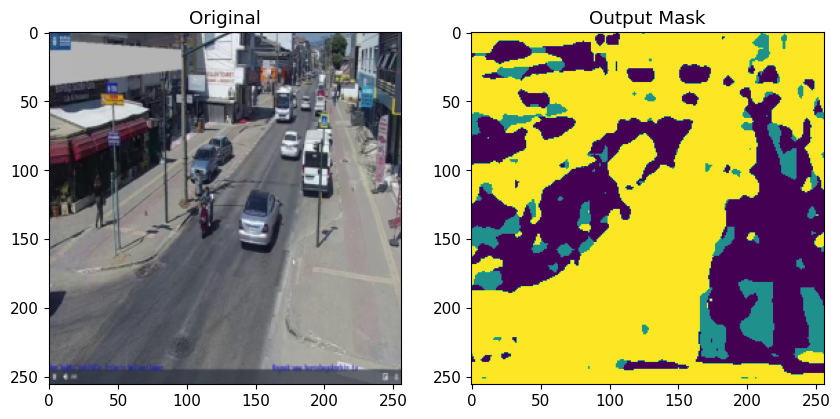

screenshot_8201_jpg.rf.4884eb4613cbeac757f6c16e2c6989c5.jpg


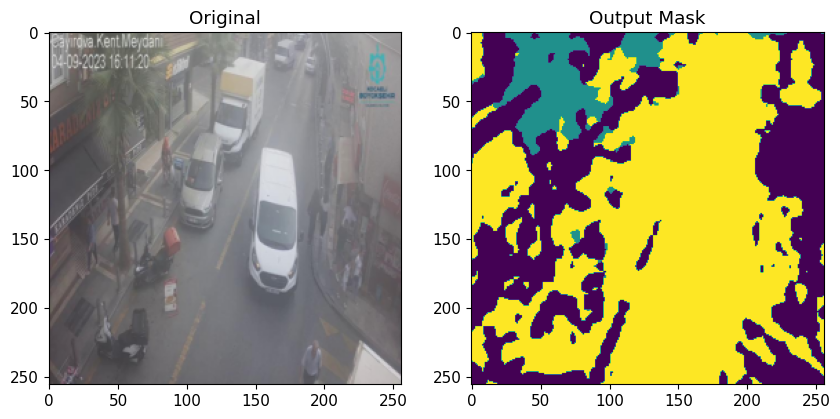

screenshot_9242_jpg.rf.ded3309a7def92abf88b3e4c9cede1d1.jpg


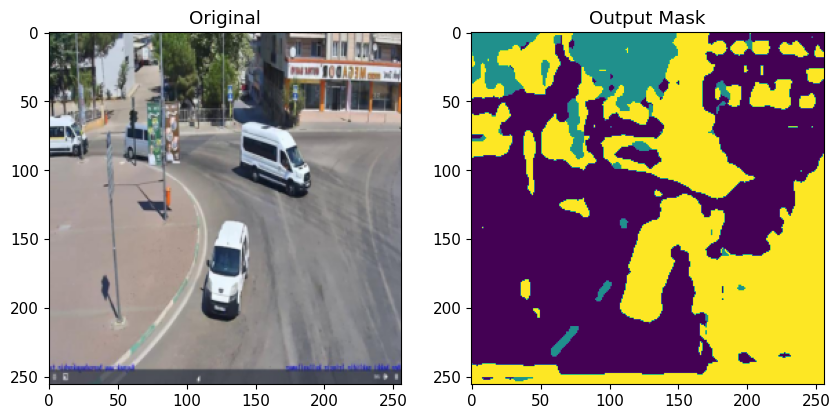

Test Loss: 0.5244


In [ ]:
model.eval()  # Set the model to evaluation mode
test_loss = 0.0
predictions = []
original_images = []

with torch.no_grad():  # No gradient computation in test phase
    for i,(test_inputs, names_t) in enumerate(test_dataloader):
        test_inputs = test_inputs.to(device)
        test_outputs = model(test_inputs)

        test_inputs_indices = torch.argmax(test_inputs, dim=1)
        loss = loss_fn(test_outputs, test_inputs_indices)
        test_loss += loss.item()

        # Convert to CPU for visualization
        inputs_cpu = test_inputs.cpu()
        outputs_cpu = test_outputs.cpu()

        if i%5 == 0:
            # Visualization and printing code...
            plt.figure(figsize=(10, 5))

            # Display the original image
            plt.subplot(1, 2, 1)
            imshow_tensor(inputs_cpu[0])
            print(names_t[0])
            plt.title(f"Original")

            # Display the corresponding mask
            plt.subplot(1, 2, 2)
            imshow_tensor(outputs_cpu[0], is_mask=True)
            plt.title("Output Mask")

            plt.show()
            plt.close()

avg_test_loss = test_loss / len(test_dataloader)
print(f'Test Loss: {avg_test_loss:.4f}')
